# Eigen-faces from Scratch

## Imports and dependencies

In [4]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from sklearn import preprocessing
from sklearn import svm



### Loading dataset

In [5]:
path ='/content/drive/MyDrive/Classroom/Computer Vision/face-lfw-train'

images_names = os.listdir(path)
total = len(os.listdir(path))
print('total images are: ', total)

image_paths = []
for name in images_names:
  image_paths.append(path+'/'+name)

total images are:  11


In [6]:
img_sample = cv2.imread( image_paths[0])
img_sample.shape

(250, 250, 3)

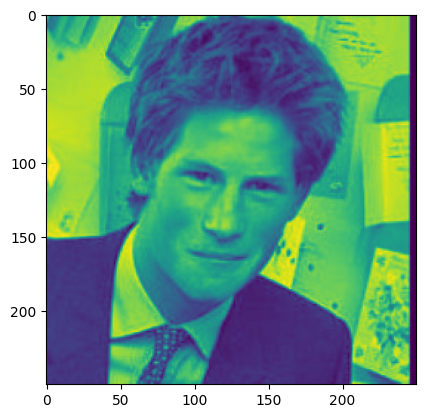

In [7]:
## image shape is 250x250
image_list = []
for img in image_paths:
  gray_img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
  np_img = np.array(gray_img )
  image_list.append(np_img)

plt.imshow( image_list[0])

In [8]:
## we also need flattened vectorized images
image_vectors = np.resize( image_list, (total, 250*250))

## Calculating Mean Image

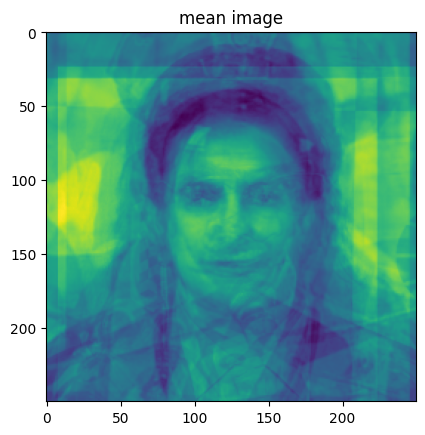

In [9]:
#mean_img = np.sum(image_list, dtype='float64')/total
mean_vector = np.sum(image_vectors, axis=0, dtype='float64')/total
mean_img = np.resize(mean_vector, (250, 250))
plt.imshow( mean_img)
plt.title('mean image')
plt.show()

(11, 62500)


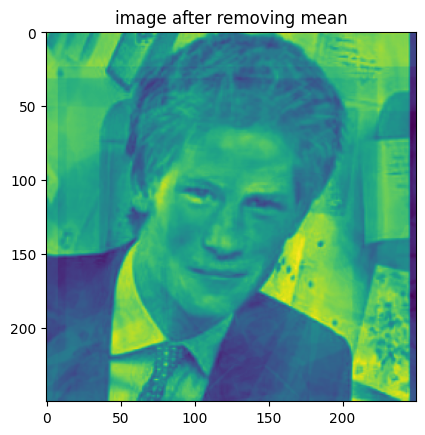

In [10]:
diff_img_vectors = image_vectors - mean_vector
print(diff_img_vectors.shape)

plt.imshow( np.resize(diff_img_vectors[0], (250,250)))
plt.title('image after removing mean')
plt.show()

## Calculating covariance matrix, eigen values and eigen vectors

In [11]:
diff_img_vectors_trans = diff_img_vectors.T
cov_matrix = diff_img_vectors.dot(diff_img_vectors_trans)
cov_matrix = cov_matrix/total
print( cov_matrix.shape)

(11, 11)


In [12]:
eig_val, eig_vec = np.linalg.eig( cov_matrix)
idx = eig_val.argsort()[::-1]
eig_val = eig_val[idx]
eig_vec = eig_vec[:, idx]

In [13]:
actual_eig_vec= diff_img_vectors_trans @ eig_vec
print( eig_vec.shape)
print( actual_eig_vec.shape)

(11, 11)
(62500, 11)


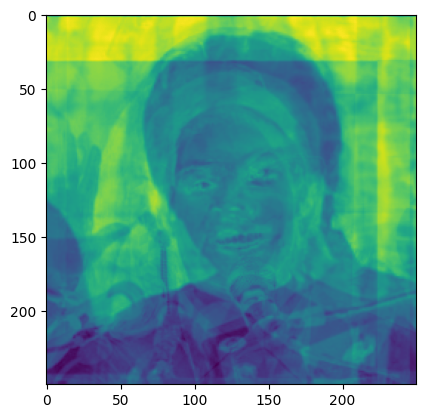

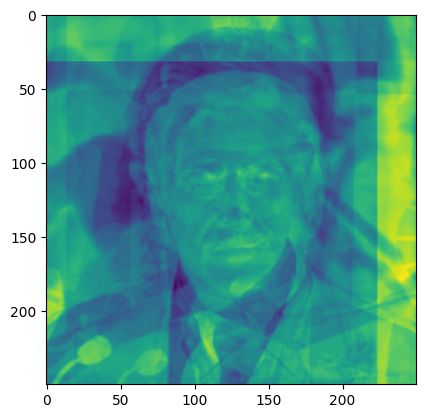

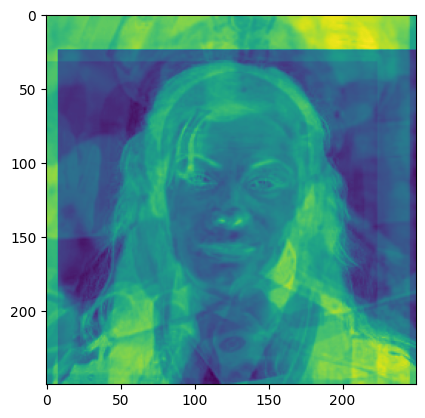

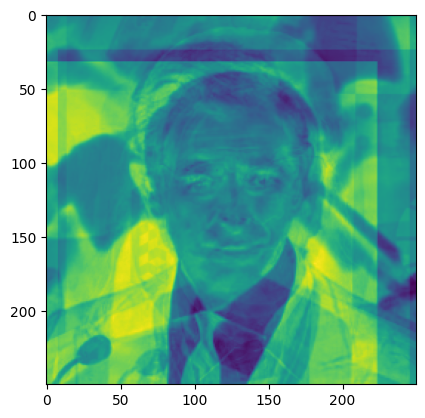

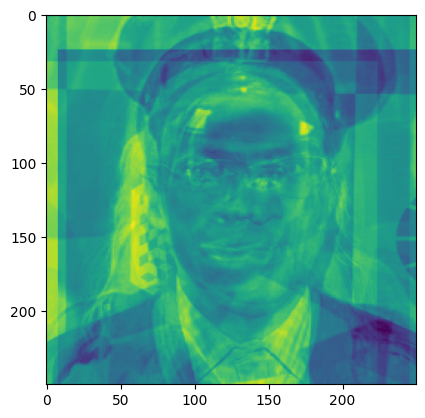

...

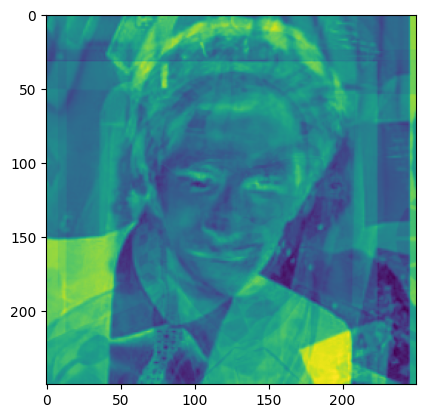

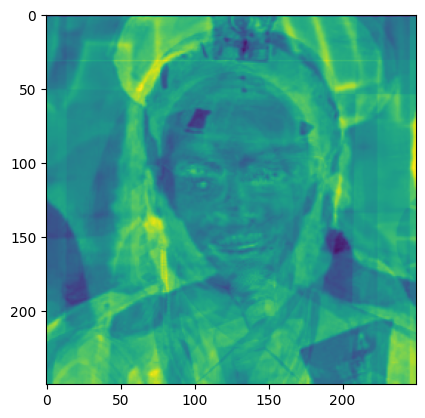

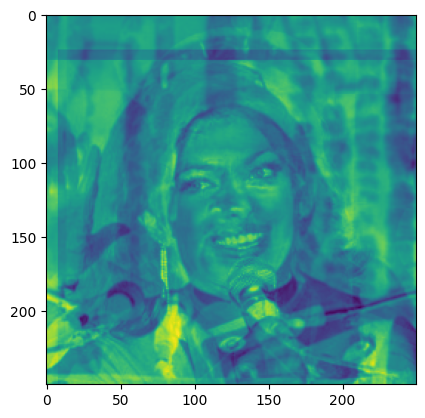

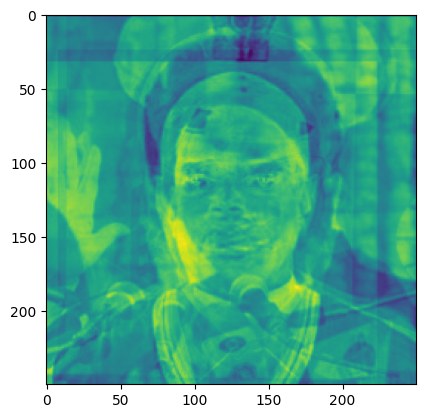

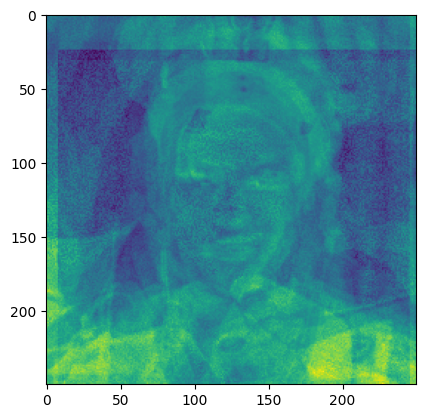

In [14]:
act_eig_vec_trans = actual_eig_vec.T # 11 * 62500
for ev in act_eig_vec_trans:
  ev_reshaped = np.resize(ev, (250, 250))
  #plt.figure( figsize = (150, 150))
  plt.imshow( ev_reshaped)
  plt.show()

## Testing

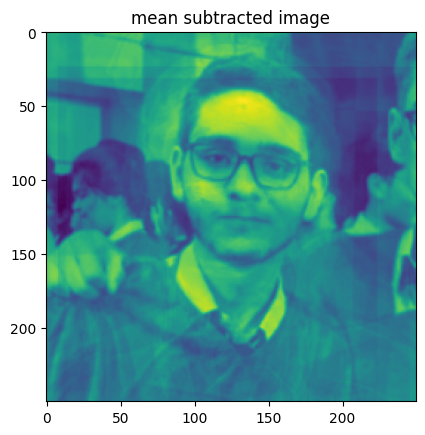

In [ ]:
test = cv2.imread('/content/test.jpg', cv2.IMREAD_GRAYSCALE)
test_vector = np.reshape( test, (250*250))
mean_sub_test = test_vector - mean_vector
plt.imshow( np.reshape( mean_sub_test, (250,250)))
plt.title('mean subtracted image')
plt.show()

In [ ]:
def give_omega( num_of_vecs):
  #omega = act_eig_vec_trans[:, :num_of_vecs].dot(mean_sub_test) # (62500*num_vec).
  omega = act_eig_vec_trans[:num_of_vecs].dot(mean_sub_test) # (num_of_vecs*62500).(62500*1)
  return omega

In [ ]:
omega = give_omega(4) #lets do our demonstration with 4 eigen vectors

#omega.shape
recon = actual_eig_vec[:, :4].dot(omega) 
print( recon.shape)

(62500,)


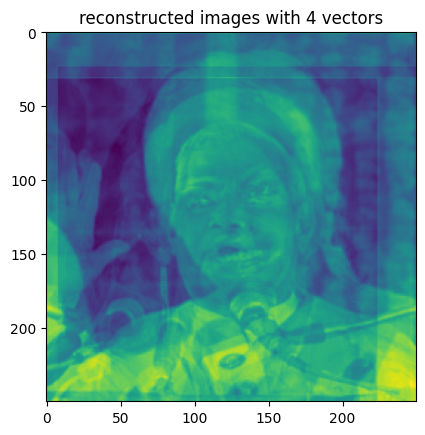

In [ ]:
plt.imshow( np.reshape( recon, (250,250)))
plt.title('reconstructed images with 4 vectors')
plt.show()

In [ ]:
def give_mean_sub_test(path):
  test = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
  plt.imshow(test)
  plt.title('original image')
  plt.show()
  test_vector = np.reshape( test, (250*250))
  mean_sub_test = test_vector - mean_vector
  plt.imshow( np.reshape( mean_sub_test, (250,250)))
  plt.title('mean subtracted image')
  plt.show()
  return mean_sub_test

def give_omega( num_of_vecs, path):
  #omega = act_eig_vec_trans[:, :num_of_vecs].dot(mean_sub_test) # (62500*num_vec).
  mean_sub_test = give_mean_sub_test(path)
  omega = act_eig_vec_trans[:num_of_vecs].dot(mean_sub_test) # (num_of_vecs*62500).(62500*1)
  return omega

def recon_with_n_vec(n, path):
  omega = give_omega(n, path) #lets do our demonstration with 4 eigen vectors
  recon = actual_eig_vec[:, :n].dot(omega) 

  plt.imshow( np.reshape( recon, (250,250)))
  plt.title(f'reconstructed images with {n} vectors')
  plt.show()  



### Using a test Image

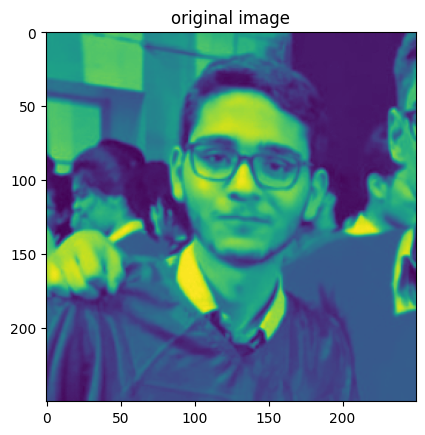

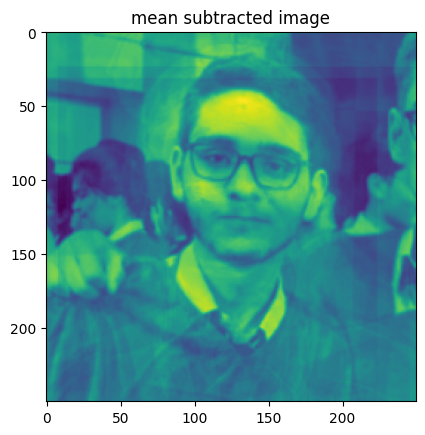

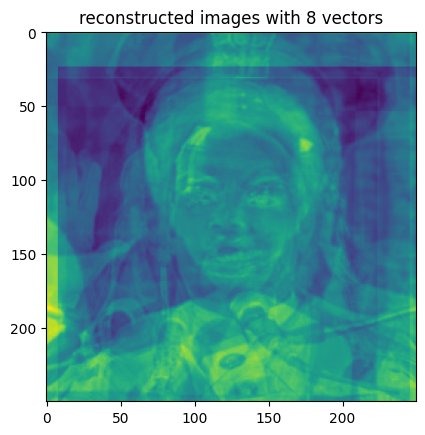

In [ ]:
recon_with_n_vec(8, '/content/test.jpg')

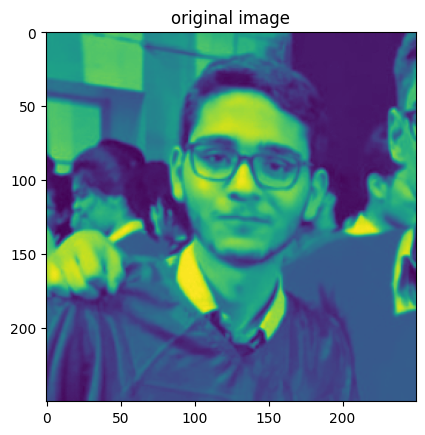

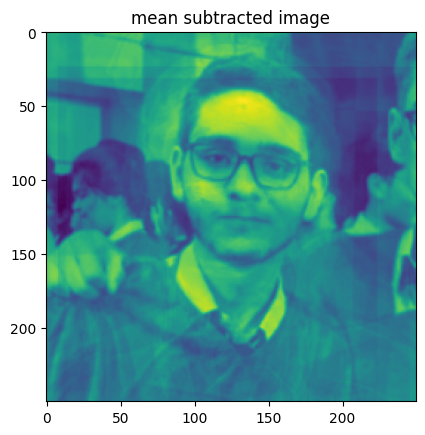

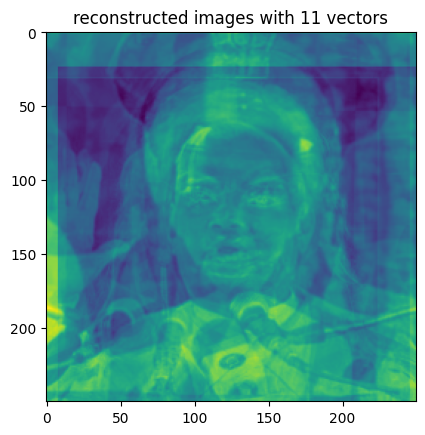

In [ ]:
recon_with_n_vec(11, '/content/test.jpg')

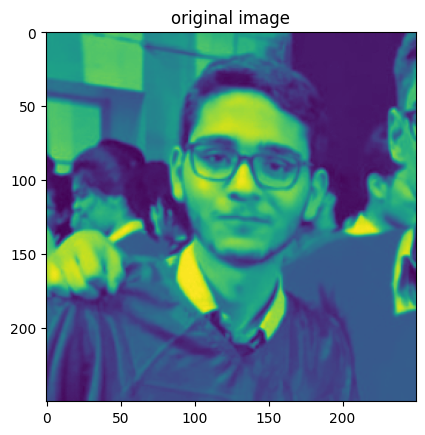

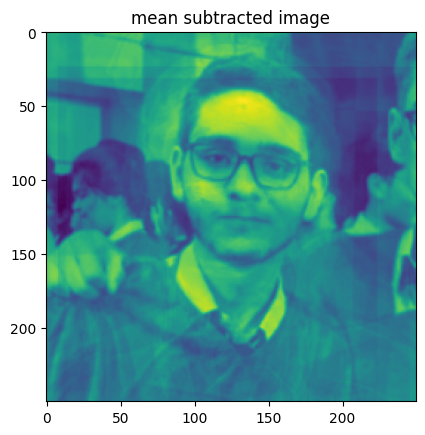

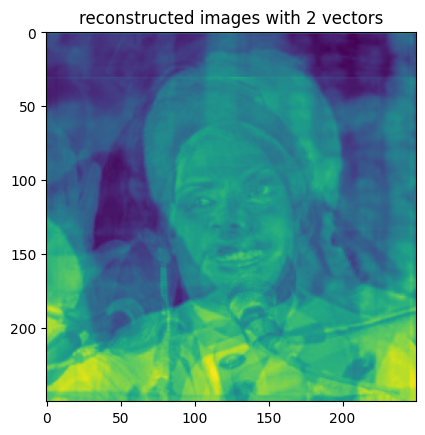

In [ ]:
recon_with_n_vec(2, '/content/test.jpg')

### Using an image from training

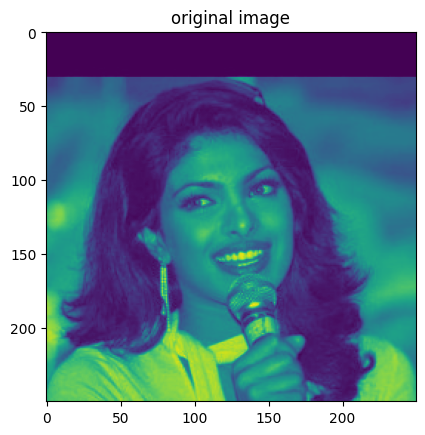

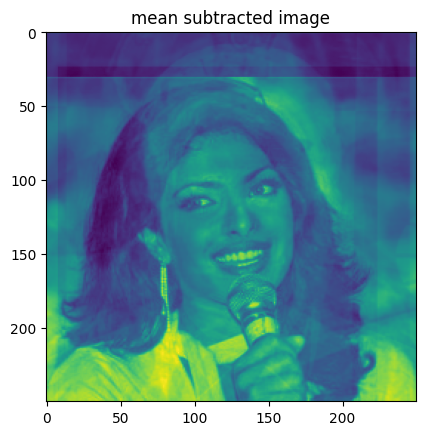

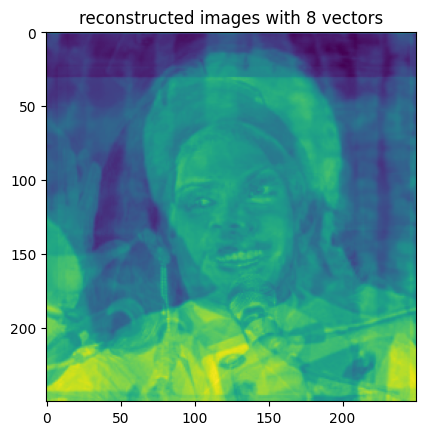

In [ ]:
## lets try an image from the dataset itself
path = '/content/drive/MyDrive/Classroom/Computer Vision/face-lfw-train/Priyanka_Chopra_0001.jpg'
recon_with_n_vec(8, path)

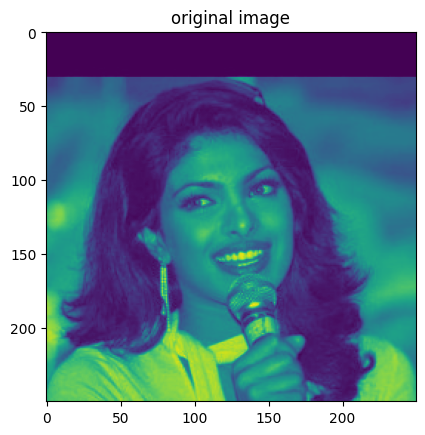

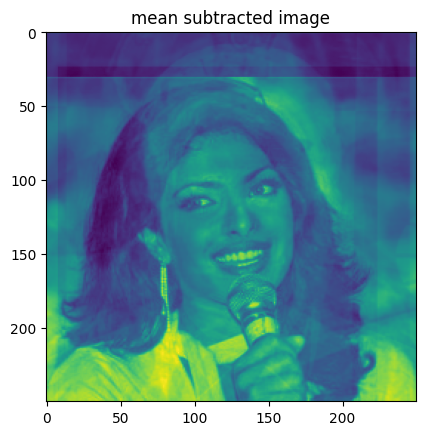

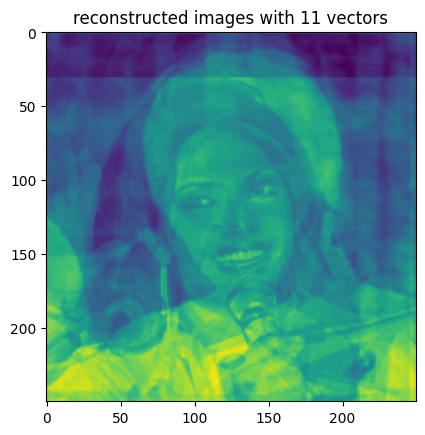

In [ ]:
recon_with_n_vec(11, path)

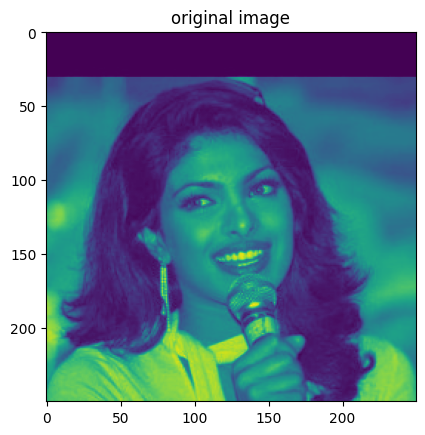

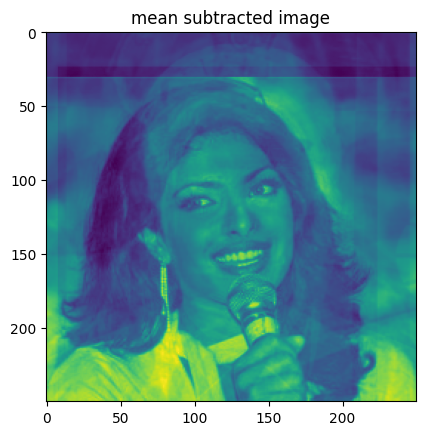

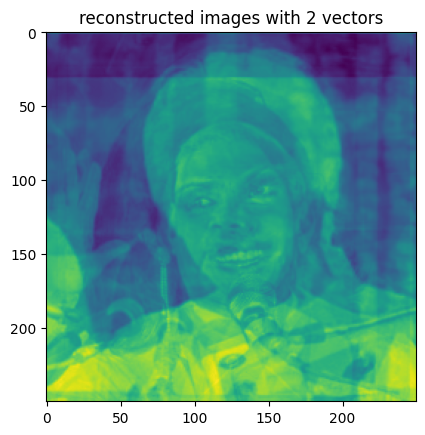

In [ ]:
recon_with_n_vec(2, path)

## A possible fault with the approach is that eigen vectors might not have been normalized

In [ ]:
actual_eig_vec_norm = preprocessing.normalize(actual_eig_vec)
print(actual_eig_vec_norm.shape)

eigen_faces = actual_eig_vec_norm.T

(62500, 11)


In [ ]:
def give_mean_sub_test(path):
  test = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
  plt.imshow(test)
  plt.title('original image')
  plt.show()
  test_vector = np.reshape( test, (250*250))
  mean_sub_test = test_vector - mean_vector
  plt.imshow( np.reshape( mean_sub_test, (250,250)))
  plt.title('mean subtracted image')
  plt.show()
  return mean_sub_test

def give_omega( num_of_vecs, path):
  #omega = act_eig_vec_trans[:, :num_of_vecs].dot(mean_sub_test) # (62500*num_vec).
  mean_sub_test = give_mean_sub_test(path)
  omega = eigen_faces[:num_of_vecs].dot(mean_sub_test) # (num_of_vecs*62500).(62500*1)
  return omega

def recon_with_n_vec_norm(n, path):
  omega = give_omega(n, path) #lets do our demonstration with 4 eigen vectors
  recon = actual_eig_vec_norm[:, :n].dot(omega) 

  plt.imshow( np.reshape( recon, (250,250)))
  plt.title(f'reconstructed images with {n} vectors')
  plt.show()  



### Test image with normalized eigen faces

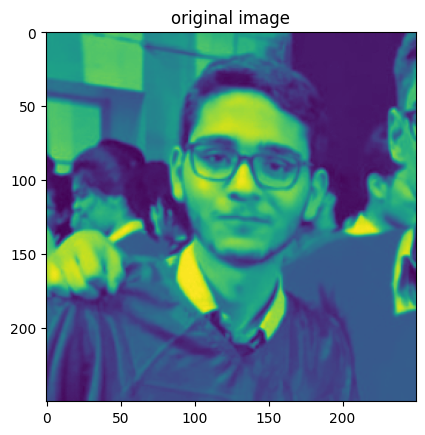

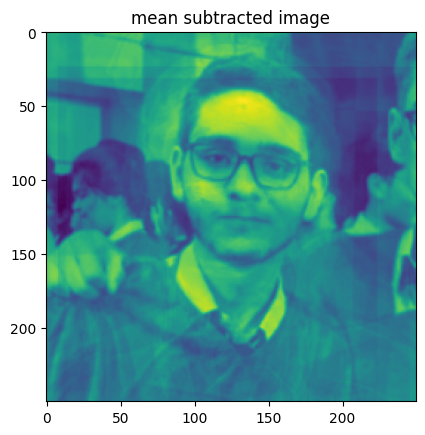

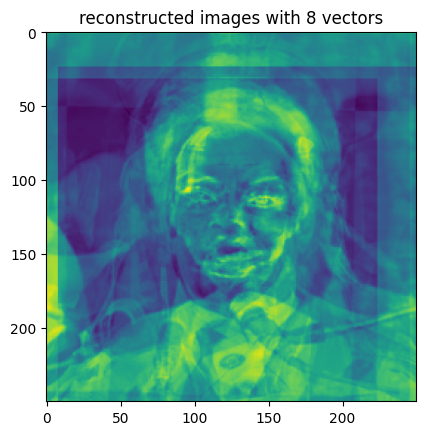

In [ ]:
test_path ='/content/test.jpg'
train_path = '/content/drive/MyDrive/Classroom/Computer Vision/face-lfw-train/Priyanka_Chopra_0001.jpg'
recon_with_n_vec_norm(8, test_path)

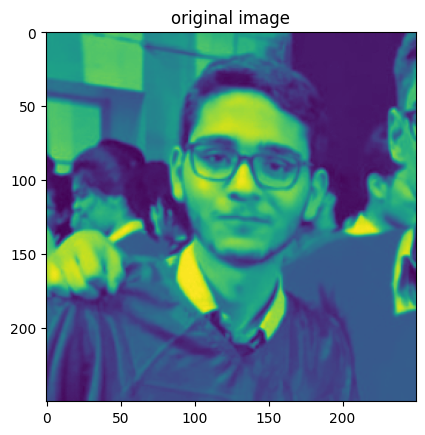

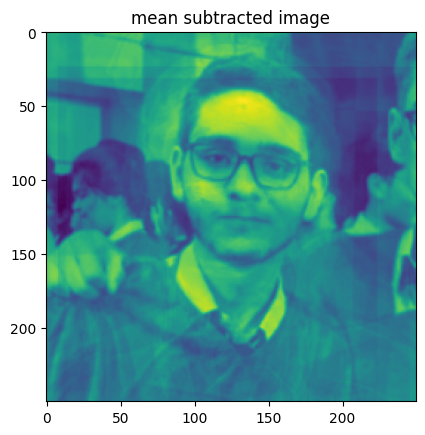

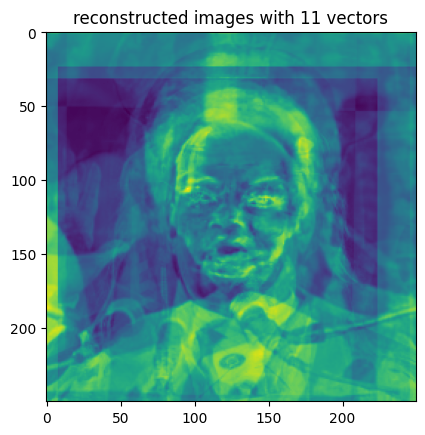

In [ ]:
recon_with_n_vec_norm(11, test_path)

### Training image reconstruction with normalized eigen faces

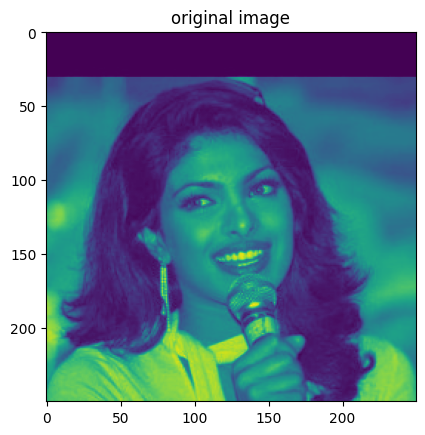

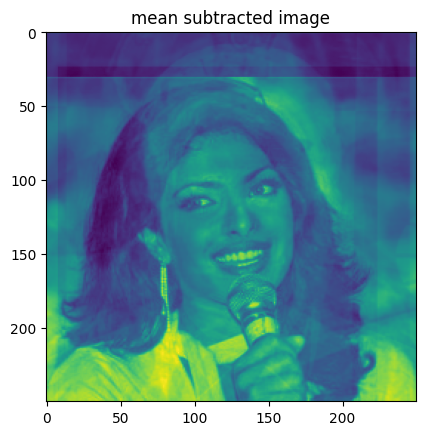

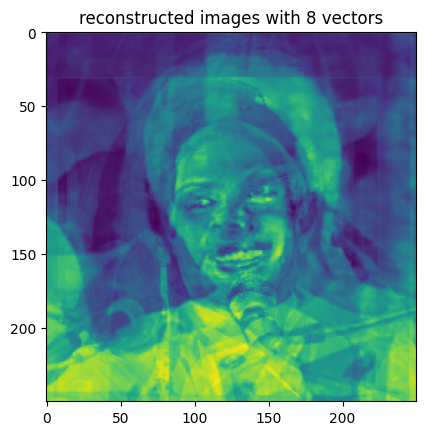

In [ ]:
recon_with_n_vec_norm(8, train_path)

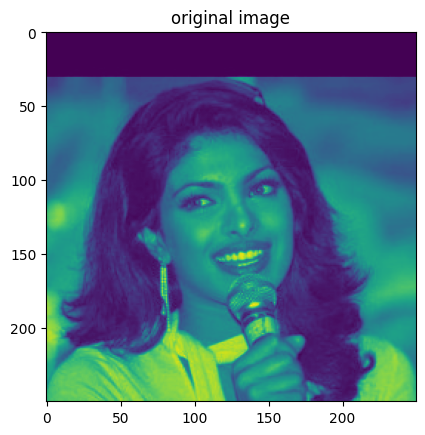

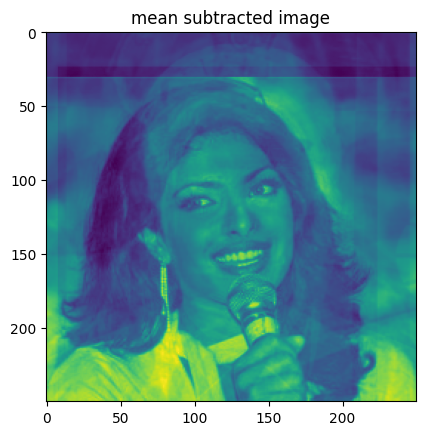

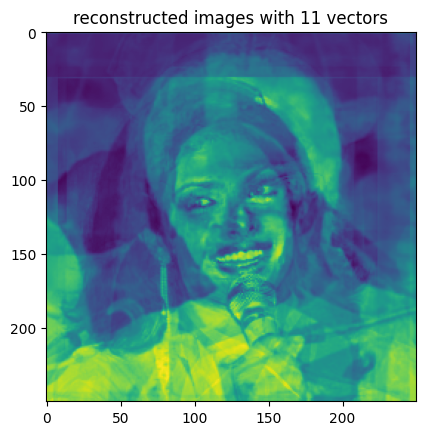

In [ ]:
recon_with_n_vec_norm(11, train_path)

# Reconstructing face of my sports person

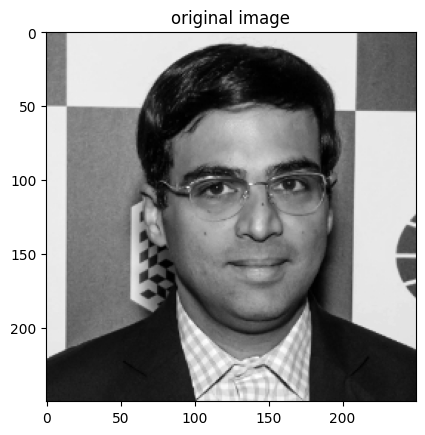

In [ ]:
path = '/content/drive/MyDrive/Classroom/Computer Vision/face-lfw-train/vishy.jpg'
img =cv2.imread(path, cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap='gray')
plt.title('original image')
plt.show()



def give_mean_sub_test(path):
  test = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
  # plt.imshow(test, cmap='gray')
  # plt.title('original image')
  # plt.show()
  test_vector = np.reshape( test, (250*250))
  mean_sub_test = test_vector - mean_vector
  # plt.imshow( np.reshape( mean_sub_test, (250,250)), cmap='gray')
  # plt.title('mean subtracted image')
  # plt.show()
  return mean_sub_test

def give_omega( num_of_vecs, path):
  #omega = act_eig_vec_trans[:, :num_of_vecs].dot(mean_sub_test) # (62500*num_vec).
  mean_sub_test = give_mean_sub_test(path)
  omega = eigen_faces[:num_of_vecs].dot(mean_sub_test) # (num_of_vecs*62500).(62500*1)
  return omega

def recon_with_n_vec_norm(n, path):
  omega = give_omega(n, path) #lets do our demonstration with 4 eigen vectors
  recon = actual_eig_vec_norm[:, :n].dot(omega) 

  plt.imshow( np.reshape( recon, (250,250)), cmap='gray')
  plt.title(f'reconstructed images with {n} vectors')
  plt.show()  



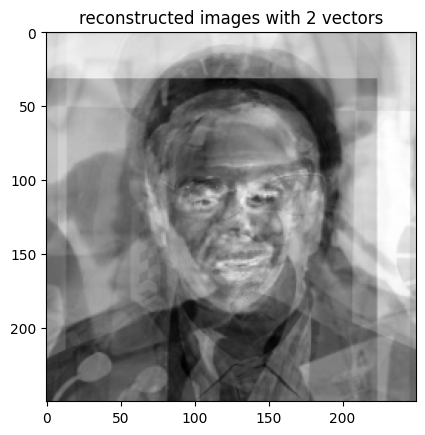

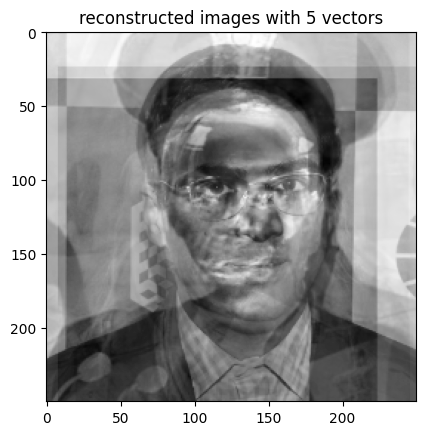

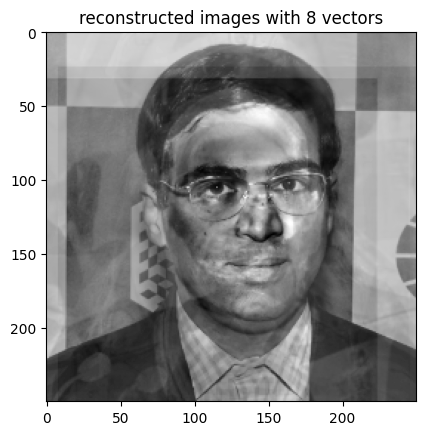

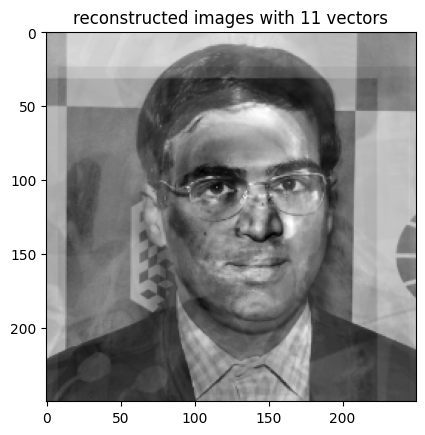

In [ ]:
for i in range( 2, 12, 3):
  recon_with_n_vec_norm(i, path)

# Recognition

## Getting feature vectors

In [1]:
def project_training_images(eigen_faces, mean_sub_train_images):
    feature_vectors = mean_sub_train_images.dot(eigen_faces)
    #feature_vectors = feature_vectors.T
    return feature_vectors


In [15]:
mean_sub_train_images = image_vectors - mean_vector
feature_vec = project_training_images(actual_eig_vec, mean_sub_train_images)


In [16]:
feature_vec.shape

(11, 11)

## Training

In [17]:
# feature_vectors: array of shape (num_samples, num_eigenfaces)
# labels: array of shape (num_samples,)
def train_classifier(feature_vectors, labels):
    clf = svm.SVC(kernel='poly', degree =3)
    clf.fit(feature_vectors, labels)
    return clf


In [21]:
print( len(images_names))
print( images_names[10])

11
vishy.jpg


In [22]:
# our target image is the last image in the images' list, therefore labels will be
labels = []
for i in range(10):
  labels.append(0)
labels.append(1)


In [24]:
clf = train_classifier( feature_vec, labels)

## Test image processing

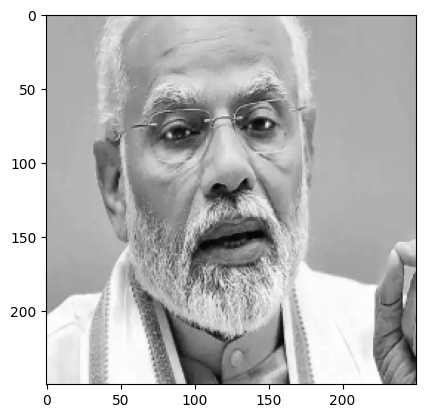

In [30]:
test_1 = '/content/Screenshot from 2023-04-09 22-17-08.png'
test_2 = '/content/Screenshot from 2023-04-09 22-16-54.png'

test_1 = cv2.imread(test_1, cv2.IMREAD_GRAYSCALE)
test_2 = cv2.imread(test_2, cv2.IMREAD_GRAYSCALE)
test_1 = cv2.resize(test_1, (250, 250))
test_2 = cv2.resize(test_2, (250, 250))

plt.imshow(test_1, cmap='gray')

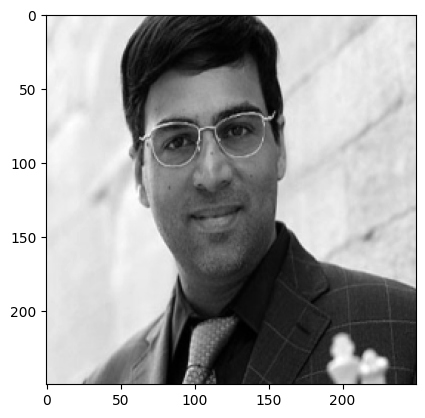

In [31]:
plt.imshow(test_2, cmap='gray')

In [37]:
test_1_vec =  np.resize( test_1, (1,250*250))
test_2_vec =  np.resize( test_2, (1,250*250))

mean_sub_test_1 = test_1_vec - mean_vector
mean_sub_test_2 = test_2_vec - mean_vector

feature_test_1 = mean_sub_test_1.dot(actual_eig_vec)
feature_test_2 = mean_sub_test_2.dot(actual_eig_vec)

## Testing

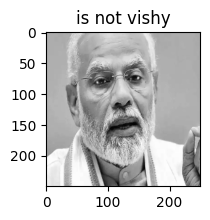

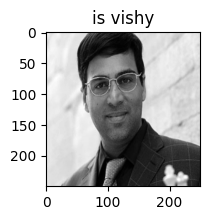

In [47]:
pred_1 =  clf.predict(feature_test_1)[0]
pred_2 =  clf.predict(feature_test_2)[0]
vishy_not_vishy = ['is not vishy', 'is vishy']
plt.figure(figsize= (2,2) )
plt.imshow( test_1, cmap='gray')
plt.title(vishy_not_vishy[pred_1])
plt.show()
plt.figure(figsize= (2,2) )
plt.imshow( test_2, cmap='gray')
plt.title(vishy_not_vishy[pred_2])
plt.show()